# Telangana Crop Health Challenge
---
###  Can you predict the health status of crops?




---



# Setup Notebook

In [7]:
%%capture
!pip install earthengine-api geopandas rasterio rasterstats shapely

# Libraries and Modules Import

In [2]:
# Standard Library Imports
from concurrent.futures import ThreadPoolExecutor, as_completed
from joblib import Parallel, delayed
from tqdm import tqdm
from datetime import datetime
from pathlib import Path
import os
import random

# Third-Party Imports
import seaborn as sns

import ee
import geemap
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio
from lightgbm import LGBMClassifier
from shapely.affinity import scale, translate
from skimage import exposure
from sklearn.metrics import classification_report, f1_score
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix


from shapely import wkt
import geopandas as gpd

import warnings
warnings.filterwarnings('ignore')


import logging
# Set up a logger to capture Rasterio warnings
logging.getLogger("rasterio._env").setLevel(logging.ERROR)

# Project Setup and Earth Engine Initialization

In [3]:
# Define the root path for the project
root_path = Path("C:/Users/khale/ML/PR")

In [3]:
# Authenticate with Google Earth Engine
# This opens a browser prompt for authentication, if not previously authenticated
ee.Authenticate()

# Initialize Earth Engine with a specific project
# Replace "project" with your project ID as needed
ee.Initialize(project="ee-khaledalnobani1234")

# Data Loading and Preprocessing

**Load Train and Test**

In [4]:
# Load training and testing datasets from CSV files
train = pd.read_csv(root_path / 'train.csv')
test = pd.read_csv(root_path / 'test.csv')

**Convert Geometry Columns to Geospatial Format**

In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8775 entries, 0 to 8774
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   FarmID           8775 non-null   int64 
 1   category         8775 non-null   object
 2   Crop             8775 non-null   object
 3   State            8775 non-null   object
 4   District         8775 non-null   object
 5   Sub-District     8775 non-null   object
 6   SDate            8775 non-null   object
 7   HDate            8775 non-null   object
 8   CropCoveredArea  8775 non-null   int64 
 9   CHeight          8775 non-null   int64 
 10  CNext            8775 non-null   object
 11  CLast            8775 non-null   object
 12  CTransp          8775 non-null   object
 13  IrriType         8775 non-null   object
 14  IrriSource       8775 non-null   object
 15  IrriCount        8775 non-null   int64 
 16  WaterCov         8775 non-null   int64 
 17  ExpYield         8775 non-null   

In [6]:
# Convert WKT geometry to actual geometry objects in both datasets
train['geometry'] = train['geometry'].apply(wkt.loads)
test['geometry'] = test['geometry'].apply(wkt.loads)

**Convert DataFrames to GeoDataFrames**

In [7]:
# Convert pandas DataFrames to GeoDataFrames with CRS set to 'epsg:4326'
train = gpd.GeoDataFrame(train, crs='epsg:4326')
test = gpd.GeoDataFrame(test, crs='epsg:4326')


**Concatenate Train and Test Data for Unified Processing**

In [5]:
# Concatenate train and test datasets into a single DataFrame for consistent processing
# 'dataset' column distinguishes between train and test rows
data = pd.concat(
    [train.assign(dataset='train'), test.assign(dataset='test')]
).reset_index(drop=True)



**Scale Geometry Objects**

In [12]:

data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 11791 entries, 0 to 11790
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   FarmID           11791 non-null  int64   
 1   category         8775 non-null   object  
 2   Crop             11791 non-null  object  
 3   State            11791 non-null  object  
 4   District         11791 non-null  object  
 5   Sub-District     11791 non-null  object  
 6   SDate            11791 non-null  object  
 7   HDate            11791 non-null  object  
 8   CropCoveredArea  11791 non-null  int64   
 9   CHeight          11791 non-null  int64   
 10  CNext            11791 non-null  object  
 11  CLast            11791 non-null  object  
 12  CTransp          11791 non-null  object  
 13  IrriType         11791 non-null  object  
 14  IrriSource       11791 non-null  object  
 15  IrriCount        11791 non-null  int64   
 16  WaterCov         11791 non-null 

In [8]:
# Function to scale each geometry around its centroid
def scale_geometry(geometry, scale_factor):
    """
    Scale a geometry object around its centroid.

    Parameters:
        geometry (shapely.geometry.base.BaseGeometry): Geometry to scale.
        scale_factor (float): Factor by which to scale the geometry.

    Returns:
        shapely.geometry.base.BaseGeometry: Scaled geometry object.
    """
    # Calculate centroid
    centroid = geometry.centroid
    # Translate geometry to origin
    translated_geometry = translate(geometry, -centroid.x, -centroid.y)
    # Scale geometry
    scaled_geometry = scale(translated_geometry, xfact=scale_factor, yfact=scale_factor, origin=(0, 0))
    # Translate back to the original centroid
    return translate(scaled_geometry, centroid.x, centroid.y)

In [9]:
# Set the scaling factor
scale_factor = 5

# Apply the scaling function to each geometry in the data
# This modifies each geometry in place by the defined scale factor
data['geometry'] = data['geometry'].apply(scale_geometry, scale_factor=scale_factor)

# Download Image Data

**Utils**

In [19]:
# Function to ensure date format is correct
def format_date(date_str):
    """Convert date string to 'YYYY-MM-DD' format."""
    try:
        return datetime.strptime(date_str, '%d-%m-%Y').strftime('%Y-%m-%d')
    except ValueError:
        print(f"Error: Invalid date format for {date_str}. Expected 'DD-MM-YYYY'.")
        return None


**Convert GeoDataFrame to Earth Engine FeatureCollection**

In [20]:

# Function to convert a GeoDataFrame to Google Earth Engine FeatureCollection
def gdf_to_gee(gdf):
    """Converts a GeoDataFrame to an Earth Engine FeatureCollection."""
    features = []
    for _, row in gdf.iterrows():
        geom = row['geometry'].__geo_interface__  # Convert geometry to GeoJSON format
        feature = ee.Feature(ee.Geometry(geom), row.to_dict())  # Create an EE Feature
        features.append(feature)
    return ee.FeatureCollection(features)

# Convert the entire dataset GeoDataFrame to a FeatureCollection for GEE
gee_feature_collection = gdf_to_gee(data)

In [21]:
data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 11791 entries, 0 to 11790
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   FarmID           11791 non-null  int64   
 1   category         8775 non-null   object  
 2   Crop             11791 non-null  object  
 3   State            11791 non-null  object  
 4   District         11791 non-null  object  
 5   Sub-District     11791 non-null  object  
 6   SDate            11791 non-null  object  
 7   HDate            11791 non-null  object  
 8   CropCoveredArea  11791 non-null  int64   
 9   CHeight          11791 non-null  int64   
 10  CNext            11791 non-null  object  
 11  CLast            11791 non-null  object  
 12  CTransp          11791 non-null  object  
 13  IrriType         11791 non-null  object  
 14  IrriSource       11791 non-null  object  
 15  IrriCount        11791 non-null  int64   
 16  WaterCov         11791 non-null 

**Initialize Earth Engine and Set Up Directories**

In [30]:
# if you already downloaded the data.
donwload = True

# Initialize Earth Engine
ee.Initialize()

# Remove existing 'downloads' folder if it exists
# if os.path.exists('downloads'):
    # os.system('rm -rf downloads')

# Ensure the output directory exists
output_folder = 'downloads3'
os.makedirs(output_folder, exist_ok=True)

**Download from Earth Engine**

In [31]:
# Function to download RGB images from Earth Engine
def download_rgb_image(collection_name, bands, start_date, end_date, region, output_folder='downloads3'):
    """Download RGB bands from a GEE collection filtered by date and region."""
    # Load the image collection, filter by date, and clip to region
    collection = ee.ImageCollection(collection_name).filterDate(start_date, end_date).filterBounds(region)
    image = collection.sort('system:time_start', False).first().select(bands).clip(region)  # Most recent image

    # Define unique filename based on image dates
    image_id = image.id().getInfo() or f'image_{start_date}_{end_date}'
    image_name = f'{output_folder}/{image_id}_{random.randint(1,10000)}_RGB_{start_date}_{end_date}.tif'

    # Export the image to a GeoTIFF file
    geemap.ee_export_image(
        image,
        filename=image_name,
        scale=10,  # Sentinel-2 resolution in meters
        region=region,
        file_per_band=False,  # Save as a multi-band TIFF
        crs='EPSG:4326'
    )
    print(f"Downloaded: {image_name}")
    return image_name

In [32]:
from datetime import timedelta


# Function to process each row in the dataset for image download
def process_row(index, row):
    # Format start and end dates
    start_date = format_date(row['SDate'])
    end_date = format_date(row['HDate'])
    
    start_date = datetime.strptime(start_date, "%Y-%m-%d")  
    end_date = datetime.strptime(end_date, "%Y-%m-%d")      
    
   
    
    date_ranges = []
    current_start = start_date
    while current_start <= end_date:
        current_end = current_start + timedelta(days=20)  
    
        date_ranges.append((
        current_start.strftime("%Y-%m-%d"),  
        current_end.strftime("%Y-%m-%d")
    ))
    
        
        current_start = current_end + timedelta(days=1)  
        
    all_features = []

    # Skip rows with invalid dates
    if not start_date or not end_date:
        print(f"Skipping entry due to invalid dates: SDate={row['SDate']}, HDate={row['HDate']}")
        return index, None

    # Extract and check geometry
    region_geometry = row['geometry']
    district = row['District']

    # Verify valid geometry and convert it to EE format
    if region_geometry.is_empty:
        print(f"Skipping entry due to empty geometry for District: {district}")
        return index, None

    # Convert geometry type to EE compatible format
    if region_geometry.geom_type == 'Polygon':
        region = ee.Geometry.Polygon(region_geometry.__geo_interface__['coordinates'])
    elif region_geometry.geom_type == 'MultiPolygon':
        coords = [polygon.exterior.coords[:] for polygon in region_geometry.geoms]
        region = ee.Geometry.MultiPolygon(coords)
    else:
        print(f"Skipping unsupported geometry type: {region_geometry.geom_type} for District: {district}")
        return index, None

    # Define Sentinel-2 collection and bands
    image_collection_name = 'COPERNICUS/S2'
    bands = ['B4', 'B3', 'B2', 'B8', 'B5', 'B6', 'B7', 'B8A', 'B11', 'B12']
    
    i =0
    for range_start, range_end in date_ranges:
    
        try:
            image_file = download_rgb_image(image_collection_name, bands, range_start, range_end, region)
            all_features.append(image_file)

        except Exception as e:
            print(f"Error processing entry for District {district}: {e}, {i}")
            continue
        i+=1
    return index, all_features
            

In [ ]:
if donwload:
  # Execute image downloads for each row in parallel to improve performance
  with ThreadPoolExecutor(max_workers=40) as executor:  # Adjust the number of workers as needed
      futures = [executor.submit(process_row, index, row) for index, row in data.iterrows()]
      for future in as_completed(futures):
          index, image_file = future.result()
          if image_file:
              data.at[index, 'tif_path'] = ", ".join(image_file)   # Store the downloaded file path
              # print(data['tif_path'])

data.to_csv("data_per20")
# else:
  # Load existing data with image paths if downloads are not required
  # os.system('cp -r C:/Users/khale/ML/PR/downloads')
  # data_path = "C:/Users/khale/ML/PR/data_tif.csv"


  # data = pd.read_csv(data_path)

C:\Users\khale\ML\PR\.venv\Lib\site-packages\ee\deprecation.py:207: DeprecationWarning: 

Attention required for COPERNICUS/S2! You are using a deprecated asset.
To ensure continued functionality, please update it.
Learn more: https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S2

  warnings.warn(warning, category=DeprecationWarning)


Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Please wait ...
Generating URL ...
Generating URL ...
Please wait ...
Generating URL ...
Please wait ...
Generating URL ...
Please wait ...
Please wait ...
Please wait ...
Please wait ...
Please wait ...
Please wait ...
Please wait ...
Please wait ...
Please wait ...
Please wait ...
Please wait ...
Please wait ...
Please wait ...
Ple

In [34]:
data.head(20)

,FarmID,category,Crop,State,District,Sub-District,SDate,HDate,CropCoveredArea,CHeight,...,CTransp,IrriType,IrriSource,IrriCount,WaterCov,ExpYield,Season,geometry,dataset,tif_path
0,1326576,Healthy,Paddy,Telangana,Medak,Kulcharam,25-11-2023,14-04-2024,97,54,...,Transplanting,Flood,Groundwater,4,87,17,Rabi,"POLYGON ((78.18079 17.97897, 78.1811 17.97948,...",train,downloads3/20231214T051219_20231214T051218_T43...
1,1326577,Healthy,Paddy,Telangana,Medak,Kulcharam,13-11-2023,26-04-2024,82,58,...,Transplanting,Flood,Canal,5,94,15,Rabi,"POLYGON ((78.17483 17.98151, 78.17649 17.98136...",train,downloads3/20231202T052151_20231202T052152_T43...
2,1326578,Healthy,Paddy,Telangana,Medak,Kulcharam,19-12-2023,28-04-2024,92,91,...,Transplanting,Flood,Canal,3,99,20,Rabi,"POLYGON ((78.16888 17.97673, 78.16968 17.97661...",train,downloads3/20240106T052219_20240106T052845_T43...
3,1331836,Diseased,Paddy,Telangana,Medak,Kulcharam,11-02-2023,04-11-2024,91,52,...,Transplanting,Flood,Canal,5,92,16,Rabi,"POLYGON ((78.16822 17.97469, 78.16955 17.97522...",train,downloads3/20230302T051729_20230302T052948_T43...
4,1326579,Diseased,Paddy,Telangana,Medak,Kulcharam,12-12-2023,19-05-2024,94,55,...,Transplanting,Flood,Canal,5,97,20,Rabi,"POLYGON ((78.17244 17.96962, 78.17303 17.96964...",train,downloads3/20231229T051221_20231229T052219_T43...
5,1326580,Pests,Paddy,Telangana,Medak,Kulcharam,13-12-2023,18-05-2024,97,51,...,Transplanting,Flood,Groundwater,5,85,15,Rabi,"POLYGON ((78.17245 17.96372, 78.17373 17.96361...",train,downloads3/20240101T052221_20240101T052222_T43...
6,1326581,Healthy,Paddy,Telangana,Medak,Kulcharam,20-11-2023,30-05-2024,84,68,...,Transplanting,Flood,Canal,3,90,15,Rabi,"POLYGON ((78.17634 17.95971, 78.17691 17.95963...",train,downloads3/20231209T051211_20231209T051207_T43...
7,988392,Healthy,Paddy,Telangana,Medak,Kulcharam,14-12-2023,04-04-2024,86,72,...,Transplanting,Flood,Canal,3,91,15,Rabi,"POLYGON ((78.17837 17.95812, 78.17938 17.95834...",train,downloads3/20240101T052221_20240101T052222_T43...
8,718074,Diseased,Paddy,Telangana,Medak,Kulcharam,12-10-2023,05-10-2024,90,78,...,Transplanting,Flood,Canal,3,86,18,Rabi,"POLYGON ((78.18051 17.95176, 78.18168 17.95205...",train,downloads3/20231030T050931_20231030T052210_T43...
9,214818,Healthy,Paddy,Telangana,Medak,Kulcharam,12-10-2023,22-04-2024,90,53,...,Transplanting,Flood,Groundwater,5,90,19,Rabi,"POLYGON ((78.18042 17.94661, 78.18134 17.94651...",train,downloads3/20231030T050931_20231030T052210_T43...


In [14]:
df3 = pd.read_csv('data_per20')
df3

,Unnamed: 0,FarmID,category,Crop,State,District,Sub-District,SDate,HDate,CropCoveredArea,...,CTransp,IrriType,IrriSource,IrriCount,WaterCov,ExpYield,Season,geometry,dataset,tif_path
0,0,1326576,Healthy,Paddy,Telangana,Medak,Kulcharam,25-11-2023,14-04-2024,97,...,Transplanting,Flood,Groundwater,4,87,17,Rabi,POLYGON ((78.18079255482755 17.978971746424413...,train,downloads3/20231214T051219_20231214T051218_T43...
1,1,1326577,Healthy,Paddy,Telangana,Medak,Kulcharam,13-11-2023,26-04-2024,82,...,Transplanting,Flood,Canal,5,94,15,Rabi,POLYGON ((78.17483419891283 17.981508840879556...,train,downloads3/20231202T052151_20231202T052152_T43...
2,2,1326578,Healthy,Paddy,Telangana,Medak,Kulcharam,19-12-2023,28-04-2024,92,...,Transplanting,Flood,Canal,3,99,20,Rabi,POLYGON ((78.16888476438905 17.976727511659835...,train,downloads3/20240106T052219_20240106T052845_T43...
3,3,1331836,Diseased,Paddy,Telangana,Medak,Kulcharam,11-02-2023,04-11-2024,91,...,Transplanting,Flood,Canal,5,92,16,Rabi,POLYGON ((78.16821795882959 17.974690113471414...,train,downloads3/20230302T051729_20230302T052948_T43...
4,4,1326579,Diseased,Paddy,Telangana,Medak,Kulcharam,12-12-2023,19-05-2024,94,...,Transplanting,Flood,Canal,5,97,20,Rabi,POLYGON ((78.17244459940454 17.969620948965225...,train,downloads3/20231229T051221_20231229T052219_T43...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11786,11786,551119,NaN,Maize,Telangana,Nirmal,Sarangapur,12-10-2023,03-07-2024,92,...,Drilling,Drip,Groundwater,4,44,39,Rabi,"POLYGON ((78.25900010978795 19.22927351046702,...",test,downloads3/20231030T050931_20231030T052210_T43...
11787,11787,916476,NaN,Maize,Telangana,Nirmal,Sarangapur,11-05-2023,03-04-2024,79,...,Seed Drilling,Drip,Canal,3,41,40,Rabi,POLYGON ((78.25818808460964 19.202014687110104...,test,downloads3/20230528T050659_20230528T051854_T43...
11788,11788,121860,NaN,Maize,Telangana,Nirmal,Sarangapur,14-11-2023,04-03-2024,87,...,Broadcasting,Sprinkler,Canal,3,43,41,Rabi,"POLYGON ((78.2554603258883 19.19636630652319, ...",test,downloads3/20231202T052151_20231202T052152_T43...
11789,11789,270936,NaN,Maize,Telangana,Nirmal,Sarangapur,12-02-2023,26-03-2024,95,...,Drilling,Sprinkler,Canal,4,48,39,Rabi,POLYGON ((78.25742756428231 19.195573453548704...,test,downloads3/20230302T051729_20230302T052948_T43...


# Visualization

In [10]:
# Function to scale pixel values to the 0–255 range for better visualization
def scale_band(band):
    """
    Scales pixel values of a single band to the 0-255 range.

    Parameters:
    - band: np.array, pixel values of the band

    Returns:
    - np.array, scaled pixel values in the 0-255 range
    """
    band = band.astype(np.float32)  # Ensure values are in float for scaling
    return 255 * (band - np.min(band)) / (np.max(band) - np.min(band))  # Scale to 0–255

# Function to visualize RGB image with scaling, contrast adjustments, and optional gamma correction
def visualize_rgb_image(file_path, gamma=0.6, contrast_stretch=True):
    """
    Visualize an RGB image using matplotlib with scaling, optional gamma correction, and contrast stretching.

    Parameters:
    - file_path: str, path to the RGB image file (GeoTIFF)
    - gamma: float, gamma correction factor (default=0.6)
    - contrast_stretch: bool, whether to apply contrast stretching (default=True)
    """
    # Open the image file
    with rasterio.open(file_path) as src:
        # Read RGB bands (assuming Sentinel-2 band order: Red=B4, Green=B3, Blue=B2)
        red = src.read(3)  # Band 4 for Red
        green = src.read(2)  # Band 3 for Green
        blue = src.read(1)  # Band 2 for Blue

        # Scale each band to the 0–255 range for better visualization
        red_scaled = scale_band(red)
        green_scaled = scale_band(green)
        blue_scaled = scale_band(blue)

        # Stack the scaled RGB bands into a single image
        rgb = np.dstack((red_scaled, green_scaled, blue_scaled)).astype(np.uint8)

        # Apply contrast stretching if specified
        if contrast_stretch:
            p2, p98 = np.percentile(rgb, (2, 98))  # Calculate 2nd and 98th percentiles for stretching
            rgb = exposure.rescale_intensity(rgb, in_range=(p2, p98))

        # Apply gamma correction to adjust brightness
        rgb = exposure.adjust_gamma(rgb, gamma=gamma)

        # Display the processed image using matplotlib
        plt.figure(figsize=(5, 5))
        plt.imshow(rgb)
        plt.axis('off')  # Hide axes for a cleaner look
        plt.title("RGB Composite (Red-Green-Blue) with Scaling, Contrast Stretch, and Gamma Correction")
        plt.show()

    return rgb

In [11]:
# Select a random image file from the dataset and visualize it
path = random.choice(data['tif_path'].values)
image = visualize_rgb_image(path)

KeyError: 'tif_path'

# Feature Engineering

**Utils**

In [29]:
import numpy as np

# Normalized Difference Vegetation Index (NDVI)
def calculate_ndvi(nir, red):
    return np.nanmean((nir - red) / (nir + red ))

# Green Normalized Difference Vegetation Index (GNDVI)
def calculate_gndvi(nir, green,):
    return np.nanmean((nir - green) / (nir + green ))  # Fixed to use 'green' band

# Enhanced Vegetation Index (EVI)
def calculate_evi(nir, red, blue, ):
    return np.nanmean(2.5 * (nir - red) / (nir + 6 * red - 7.5 * blue + 1 ))

# Normalized Difference Water Index (NDWI)
def calculate_ndwi(green, nir, epsilon=0):
    return np.nanmean((green - nir) / (green + nir + epsilon))

# Normalized Difference Built-up Index (NDBI)
def calculate_ndbi(swir1, nir, epsilon=0):
    return np.nanmean((swir1 - nir) / (swir1 + nir + epsilon))

# Soil-Adjusted Vegetation Index (SAVI)
def calculate_savi(nir, red, L=0.5, epsilon=0):
    return np.nanmean(((nir - red) / (nir + red + L + epsilon)) * (1 + L))

# Normalized Burn Ratio (NBR)
def calculate_nbr(nir, swir2, epsilon=0):
    return np.nanmean((nir - swir2) / (nir + swir2 + epsilon))

# Enhanced Vegetation Index 2 (EVI2)
def calculate_evi2(nir, red, epsilon=0):
    return np.nanmean(2.5 * (nir - red) / (nir + 2.4 * red + 1 + epsilon))

# Modified Soil-Adjusted Vegetation Index (MSAVI)
def calculate_msavi(nir, red):
    return np.nanmean((2 * nir + 1 - np.sqrt((2 * nir + 1)**2 - 8 * (nir - red))) / 2)

# Simple Ratio (SR)
def calculate_sr(nir, red, epsilon=0):
    return np.nanmean(nir / (red + epsilon))

# Green Chlorophyll Index (GCI)
def calculate_gci(nir, green, epsilon=0):
    return np.nanmean((nir / (green + epsilon)) - 1)

# Structure Insensitive Pigment Index (SIPI)
def calculate_sipi(nir, blue, red, epsilon=0):
    return np.nanmean((nir - blue) / (nir - red + epsilon))

# Canopy Water Index (CWI)
def calculate_cwi(green, swir1, nir, epsilon=0):
    return np.nanmean((green * swir1) / (nir**2 + epsilon))

# Moisture Stress Index (MSI)
def calculate_msi(swir1, nir, epsilon=0):
    return np.nanmean(swir1 / nir)

# Normalized Multi-band Drought Index (NMDI)
def calculate_nmdi(nir, swir1, swir2, epsilon=0):
    return np.nanmean((nir - (swir1 - swir2)) / (nir + (swir1 - swir2) + epsilon))

# Red Index (RI)
def calculate_ri(red, green, epsilon=0):
    return np.nanmean(red / (green + epsilon))

# Green Leaf Index (GLI)
def calculate_gli(green, red, blue, epsilon=0):
    return np.nanmean((2 * green - red - blue) / (2 * green + red + blue + epsilon))

# Blue-Green Ratio (PSRI)
def calculate_psri(red, blue, red_edge, epsilon=0):
    return np.nanmean((red - blue) / (red_edge + epsilon))

# Normalized Difference Red Edge (NDRE)
def calculate_ndre(nir, red_edge, epsilon=0):
    return np.nanmean((nir - red_edge) / (nir + red_edge + epsilon))

# Normalized Difference Index 45 (NDI45)
def calculate_ndi45(red, blue, epsilon=0):
    return np.nanmean((red - blue) / (red + blue + epsilon))

# Saturation Index (SI)
def calculate_si(blue, green, red, epsilon=0):
    return np.nanmean((blue + green + red) / 3)


In [30]:
import re
def extract_dates_from_filename(filename):
    dates = re.findall(r'\d{4}-\d{2}-\d{2}', filename)
    return dates

In [36]:
from rasterio.errors import RasterioIOError


def process_row_for_time_series(index, row):
    results = []  

    tif_paths = row.get('tif_path', None)

    if not isinstance(tif_paths, str) or not tif_paths or pd.isna(tif_paths):
        print(f"Skipping entry due to missing tif_path for index {index}")
        
        return None
    tif_files = tif_paths.split(',')

    for tif_file in tif_files:
        tif_file = tif_file.strip()
        # if not os.path.exists(tif_file):
        #     print(f"File not found: {tif_file}")
        #     continue
        date = extract_dates_from_filename(tif_file)
        print(data)
        

        try:
         # bands = ['B4', 'B3', 'B2', 'B8', 'B5', 'B6', 'B7', 'B8A', 'B11', 'B12']
            with rasterio.open(tif_file) as src:
                red = src.read(1) / 10000    # B4 (Red)
                green = src.read(2) / 10000  # B3 (Green)
                blue = src.read(3)   / 10000 # B2 (Blue)
                nir = src.read(4)    / 10000 # B8 (Near-Infrared)
                red_edge1 = src.read(5) / 10000 # B5 (Red Edge 1)
                swir1 = src.read(9)   / 10000  # B11 (SWIR 1)
                swir2 = src.read(10) / 10000  # B12 (example)

                ndvi = calculate_ndvi(nir, red)
                gndvi = calculate_gndvi(nir, green)
                evi = calculate_evi(nir, red, blue)
                ndwi = calculate_ndwi(green, nir)
                ndbi = calculate_ndbi(swir1, nir)
                savi = calculate_savi(nir, red)
                nbr = calculate_nbr(nir, swir2)
                evi2 = calculate_evi2(nir, red)
                sr = calculate_sr(nir, red)
                gci = calculate_gci(nir, green)
                sipi = calculate_sipi(nir, blue, red)
                psri = calculate_psri(red, blue, red_edge1)
                msavi = calculate_msavi(nir, red)
                ndre = calculate_ndre(nir, red_edge1)

                results.append({
                    'index': index,
                    'date': date,
                    'ndvi': ndvi,
                    'gndvi':gndvi,
                    'evi': evi,
                    'ndwi': ndwi,
                    'ndbi': ndbi,
                    'savi': savi,
                    'nbr': nbr,
                    'evi2': evi2,
                    'sr': sr,
                    'gci': gci,
                    'sipi': sipi,
                    'psri': psri,
                    'msavi': msavi,
                    'ndre': ndre
               })

        except (RasterioIOError, Exception) as e:
            print(f"Error processing file {tif_file}: {e}")
            continue

    return results
# Process all rows and extract time series features
all_time_series = Parallel(n_jobs=-1)(
    delayed(process_row_for_time_series)(index, row)
    for index, row in tqdm(a.iterrows(), total=len(data))
)

100%|██████████| 11791/11791 [36:08<00:00,  5.44it/s]


In [5]:
# print(all_time_series[0])
all_time_series2 = [sublist for sublist in all_time_series if sublist]
# print(len(all_time_series2))

time_series_data3 = pd.DataFrame([entry for sublist in all_time_series2 for entry in sublist])
time_series_data3.to_csv('final_addition_with_scale.csv', index=False)
print(time_series_data3.head(10))


NameError: name 'all_time_series' is not defined

In [6]:
df = pd.read_csv('final_addition_with_scale.csv')

handle missing value


In [7]:
df.isnull().sum()

index       0
date        0
ndvi       90
gndvi      97
evi         0
ndwi       97
ndbi       97
savi        0
nbr        91
evi2        0
sr         90
gci        97
sipi     1248
psri      162
msavi       0
ndre       90
dtype: int64

In [8]:
df.isin([np.inf, -np.inf]).sum()

index       0
date        0
ndvi        0
gndvi       0
evi         7
ndwi        0
ndbi        0
savi        0
nbr         0
evi2        0
sr         73
gci        54
sipi     5442
psri      112
msavi       0
ndre        0
dtype: int64

In [9]:
df.drop(columns=['sipi','psri'],axis=1 , inplace=True)

In [10]:
df.replace(np.inf,np.nan,inplace=True)

In [12]:
df.dropna(inplace=True)
df.isnull().sum()

index    0
date     0
ndvi     0
gndvi    0
evi      0
ndwi     0
ndbi     0
savi     0
nbr      0
evi2     0
sr       0
gci      0
msavi    0
ndre     0
dtype: int64

In [44]:
df.head(5)

,index,ndvi,gndvi,evi,ndwi,ndbi,savi,nbr,evi2,sr,gci,sipi,psri,msavi,ndre,start_date,end_date
0,0,0.128852,0.147129,0.188032,-0.147129,0.080646,0.101491,0.047436,0.094351,1.297829,0.347717,0.979062,-0.003819,0.093150,0.094879,2023-11-25,2023-12-15
1,0,0.064580,0.053678,0.110147,-0.053678,-0.083869,0.049251,0.189677,0.045066,1.139315,0.114876,0.277247,-0.084814,0.044396,0.046924,2023-12-16,2024-01-05
2,0,0.133918,0.093001,0.218632,-0.093001,-0.163737,0.100463,0.278838,0.092984,1.311626,0.206907,0.597803,-0.107463,0.090829,0.078439,2024-01-06,2024-01-26
3,0,0.265563,0.208494,0.379517,-0.208494,-0.185128,0.195216,0.317304,0.185099,1.736595,0.533928,0.792971,-0.128645,0.178868,0.189134,2024-01-27,2024-02-16
4,0,0.300885,0.242610,0.498602,-0.242610,-0.186969,0.230728,0.335651,0.221436,1.870112,0.645341,0.766263,-0.181872,0.214948,0.250927,2024-02-17,2024-03-08
5,0,0.304362,0.249194,0.522084,-0.249194,-0.180542,0.239192,0.333713,0.230477,1.880967,0.666108,0.787212,-0.163832,0.224418,0.241149,2024-03-09,2024-03-29
6,0,0.199135,0.182421,0.331384,-0.182421,-0.032854,0.159195,0.194203,0.150521,1.503994,0.447702,0.873606,-0.067031,0.148118,0.149432,2024-03-30,2024-04-19
7,1,0.100932,0.119538,0.143886,-0.119538,0.098861,0.077875,0.039636,0.071865,1.226907,0.273640,0.979412,-0.004059,0.070781,0.080405,2023-11-13,2023-12-03
8,1,0.104716,0.125960,0.132528,-0.125960,0.089252,0.077646,0.016874,0.071561,1.239401,0.293667,1.031436,0.009008,0.069851,0.073675,2023-12-04,2023-12-24
9,1,0.089966,0.069611,0.153719,-0.069611,-0.075206,0.068404,0.200040,0.062853,1.198963,0.151319,0.435890,-0.097887,0.061766,0.059896,2023-12-25,2024-01-14


In [13]:
test_indices = data.loc[data['dataset'] == 'test'].index
test_indices

Index([ 8775,  8776,  8777,  8778,  8779,  8780,  8781,  8782,  8783,  8784,
       ...
       11781, 11782, 11783, 11784, 11785, 11786, 11787, 11788, 11789, 11790],
      dtype='int64', length=3016)

In [101]:
data

,FarmID,category,Crop,State,District,Sub-District,SDate,HDate,CropCoveredArea,CHeight,...,CLast,CTransp,IrriType,IrriSource,IrriCount,WaterCov,ExpYield,Season,geometry,dataset
0,1326576,Healthy,Paddy,Telangana,Medak,Kulcharam,25-11-2023,14-04-2024,97,54,...,Lentil,Transplanting,Flood,Groundwater,4,87,17,Rabi,POLYGON ((78.18143246076087 17.978884603571068...,train
1,1326577,Healthy,Paddy,Telangana,Medak,Kulcharam,13-11-2023,26-04-2024,82,58,...,Lentil,Transplanting,Flood,Canal,5,94,15,Rabi,POLYGON ((78.17545177547453 17.981074445477304...,train
2,1326578,Healthy,Paddy,Telangana,Medak,Kulcharam,19-12-2023,28-04-2024,92,91,...,Lentil,Transplanting,Flood,Canal,3,99,20,Rabi,POLYGON ((78.16914224770792 17.976212849967755...,train
3,1331836,Diseased,Paddy,Telangana,Medak,Kulcharam,11-02-2023,04-11-2024,91,52,...,Lentil,Transplanting,Flood,Canal,5,92,16,Rabi,POLYGON ((78.16889103841902 17.974608186550842...,train
4,1326579,Diseased,Paddy,Telangana,Medak,Kulcharam,12-12-2023,19-05-2024,94,55,...,Lentil,Transplanting,Flood,Canal,5,97,20,Rabi,POLYGON ((78.17264452998072 17.969251496349454...,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11786,551119,NaN,Maize,Telangana,Nirmal,Sarangapur,12-10-2023,03-07-2024,92,225,...,Maize,Drilling,Drip,Groundwater,4,44,39,Rabi,"POLYGON ((78.2590925014686 19.226585028787138,...",test
11787,916476,NaN,Maize,Telangana,Nirmal,Sarangapur,11-05-2023,03-04-2024,79,236,...,Maize,Seed Drilling,Drip,Canal,3,41,40,Rabi,POLYGON ((78.25740431425051 19.201486539517244...,test
11788,121860,NaN,Maize,Telangana,Nirmal,Sarangapur,14-11-2023,04-03-2024,87,210,...,Maize,Broadcasting,Sprinkler,Canal,3,43,41,Rabi,POLYGON ((78.25710554778851 19.196639319522475...,test
11789,270936,NaN,Maize,Telangana,Nirmal,Sarangapur,12-02-2023,26-03-2024,95,204,...,Maize,Drilling,Sprinkler,Canal,4,48,39,Rabi,POLYGON ((78.25624052602662 19.195288673296787...,test


In [14]:
df = df.loc[~df['index'].isin(test_indices)]
df.shape


(71093, 14)

In [15]:
ind = []
for i in df['index']:
    if i not in ind:
        ind.append(i)
len(ind)
    

7873

In [16]:
data = data.loc[ind]  
data


,FarmID,category,Crop,State,District,Sub-District,SDate,HDate,CropCoveredArea,CHeight,...,CLast,CTransp,IrriType,IrriSource,IrriCount,WaterCov,ExpYield,Season,geometry,dataset
0,1326576,Healthy,Paddy,Telangana,Medak,Kulcharam,25-11-2023,14-04-2024,97,54,...,Lentil,Transplanting,Flood,Groundwater,4,87,17,Rabi,POLYGON ((78.18143246076087 17.978884603571068...,train
1,1326577,Healthy,Paddy,Telangana,Medak,Kulcharam,13-11-2023,26-04-2024,82,58,...,Lentil,Transplanting,Flood,Canal,5,94,15,Rabi,POLYGON ((78.17545177547453 17.981074445477304...,train
2,1326578,Healthy,Paddy,Telangana,Medak,Kulcharam,19-12-2023,28-04-2024,92,91,...,Lentil,Transplanting,Flood,Canal,3,99,20,Rabi,POLYGON ((78.16914224770792 17.976212849967755...,train
3,1331836,Diseased,Paddy,Telangana,Medak,Kulcharam,11-02-2023,04-11-2024,91,52,...,Lentil,Transplanting,Flood,Canal,5,92,16,Rabi,POLYGON ((78.16889103841902 17.974608186550842...,train
4,1326579,Diseased,Paddy,Telangana,Medak,Kulcharam,12-12-2023,19-05-2024,94,55,...,Lentil,Transplanting,Flood,Canal,5,97,20,Rabi,POLYGON ((78.17264452998072 17.969251496349454...,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8770,166176,Healthy,Cotton,Telangana,Adilabad,Bela,05-01-2023,30-09-2023,78,81,...,Maize,Broadcasting,Drip,Tubewell,2,60,18,Kharif,"POLYGON ((78.7922461400353 19.7353978218637, 7...",train
8771,1313289,Healthy,Cotton,Telangana,Adilabad,Bela,24-05-2023,11-09-2023,81,110,...,Maize,Seed Drilling,Drip,Rainfed,3,45,11,Kharif,POLYGON ((78.79762256196975 19.753883047840567...,train
8772,1298256,Healthy,Cotton,Telangana,Adilabad,Bela,06-06-2023,30-12-2023,68,66,...,Sorghum,Broadcasting,Sprinkler,Canal,3,58,14,Kharif,"POLYGON ((78.8079827458097 19.754454612143032,...",train
8773,1323180,Healthy,Cotton,Telangana,Adilabad,Bela,15-05-2023,20-09-2023,84,101,...,Sorghum,Broadcasting,Drip,Rainfed,3,52,20,Kharif,"POLYGON ((78.80939306910888 19.75338350993396,...",train


In [17]:
# add more feature
data['SDate'] = pd.to_datetime(data['SDate'])
data['HDate'] = pd.to_datetime(data['HDate'])

data['Smonth'] = data['SDate'].dt.month
data['Hmonth'] = data['HDate'].dt.month

data['Squarter'] = data['SDate'].dt.quarter
data['Hquarter'] = data['HDate'].dt.quarter

data["dateDiff"] = (data['HDate'] - data['SDate']).dt.days

data.drop(['SDate','HDate'],inplace=True,axis=1)

In [21]:
data.drop(columns=['FarmID','State','District','Sub-District','category','geometry'],axis = 1, inplace=True)

In [22]:
col = data.select_dtypes(include=['object']).columns.tolist()

data = pd.get_dummies(data,columns=col)
data

,CropCoveredArea,CHeight,IrriCount,WaterCov,ExpYield,Smonth,Hmonth,Squarter,Hquarter,dateDiff,...,IrriType_Sprinkler,IrriType_Surface,IrriSource_Canal,IrriSource_Groundwater,IrriSource_Rainfed,IrriSource_Tubewell,IrriSource_Well,Season_Kharif,Season_Rabi,dataset_train
0,97,54,4,87,17,11,4,4,2,141,...,False,False,False,True,False,False,False,False,True,True
1,82,58,5,94,15,11,4,4,2,165,...,False,False,True,False,False,False,False,False,True,True
2,92,91,3,99,20,12,4,4,2,131,...,False,False,True,False,False,False,False,False,True,True
3,91,52,5,92,16,2,11,1,4,632,...,False,False,True,False,False,False,False,False,True,True
4,94,55,5,97,20,12,5,4,2,159,...,False,False,True,False,False,False,False,False,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8770,78,81,2,60,18,1,9,1,3,268,...,False,False,False,False,False,True,False,True,False,True
8771,81,110,3,45,11,5,9,2,3,110,...,False,False,False,False,True,False,False,True,False,True
8772,68,66,3,58,14,6,12,2,4,207,...,True,False,True,False,False,False,False,True,False,True
8773,84,101,3,52,20,5,9,2,3,128,...,False,False,False,False,True,False,False,True,False,True


In [23]:
data.drop('dataset_train', axis=1, inplace=True)

In [26]:
data

,CropCoveredArea,CHeight,IrriCount,WaterCov,ExpYield,Smonth,Hmonth,Squarter,Hquarter,dateDiff,...,IrriType_Flood,IrriType_Sprinkler,IrriType_Surface,IrriSource_Canal,IrriSource_Groundwater,IrriSource_Rainfed,IrriSource_Tubewell,IrriSource_Well,Season_Kharif,Season_Rabi
0,97,54,4,87,17,11,4,4,2,141,...,True,False,False,False,True,False,False,False,False,True
1,82,58,5,94,15,11,4,4,2,165,...,True,False,False,True,False,False,False,False,False,True
2,92,91,3,99,20,12,4,4,2,131,...,True,False,False,True,False,False,False,False,False,True
3,91,52,5,92,16,2,11,1,4,632,...,True,False,False,True,False,False,False,False,False,True
4,94,55,5,97,20,12,5,4,2,159,...,True,False,False,True,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8770,78,81,2,60,18,1,9,1,3,268,...,False,False,False,False,False,False,True,False,True,False
8771,81,110,3,45,11,5,9,2,3,110,...,False,False,False,False,False,True,False,False,True,False
8772,68,66,3,58,14,6,12,2,4,207,...,False,True,False,True,False,False,False,False,True,False
8773,84,101,3,52,20,5,9,2,3,128,...,False,False,False,False,False,True,False,False,True,False


In [27]:
from sklearn.preprocessing import StandardScaler

numerical_columns = data.select_dtypes(include=['number']).columns
scaler = StandardScaler()
for col in numerical_columns:
    data[col] = scaler.fit_transform(data[[col]])


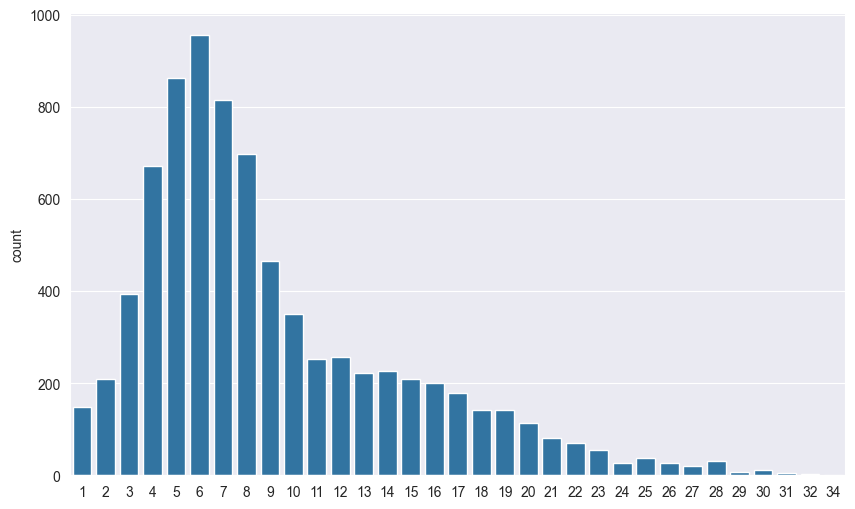

In [299]:
unique_value = df['index'].unique()
num = [len(df[df['index']==i]) for i in unique_value]

plt.figure(figsize=(10, 6))
sns.countplot(x=num)
plt.show()

In [29]:
timesteps = 30

seq = []
labels =[]
# Group data by 'index'
for i, group in df.groupby('index'):
    group_values = group.drop(columns=['index','date']).values  
    if len(group_values) < timesteps:
        padded_sequence = np.pad(
            group_values,
            pad_width=((0, timesteps - len(group_values)), (0, 0)),     
            mode='constant',
            constant_values=-9999
        )
    else:
        padded_sequence = group_values[:timesteps]
    labels.append(i)
    
    seq.append(padded_sequence)

seq = np.array(seq)  #


In [117]:
print(seq.shape)

print(len(labels))

(7873, 30, 12)
7873


In [30]:
data_np = data.to_numpy()  # Convert DataFrame to NumPy array

additional_features = data_np[:, np.newaxis, :]  # Shape: (3, 1, 1)

# Repeat the additional feature across all time steps
expanded_additional_features = np.repeat(additional_features, seq.shape[1], axis=1)  # Shape: (3, 5, 1)

# Concatenate along the feature axis (axis=2)
X_with_extra_features = np.concatenate((seq, expanded_additional_features), axis=2)
print(X_with_extra_features.shape)

(7873, 30, 64)


In [31]:
y = data.loc[labels,'category']
encoder = LabelEncoder()
y = encoder.fit_transform(y)



In [146]:
X_train, X_test, y_train, y_test = train_test_split(X_with_extra_features, y, test_size=0.15, random_state=2,stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42,stratify=y_train)


In [147]:
X_flat = X_train.reshape(X_train.shape[0], -1)
X_flat.shape

(5688, 1920)

In [164]:
from imblearn.over_sampling import SMOTE,BorderlineSMOTE
from imblearn.under_sampling import TomekLinks

tomek_links = TomekLinks()
smote = BorderlineSMOTE(random_state=42,sampling_strategy={0:2000,1:6000,2:2000,3:2000})
X_resampled_flat, y_resampled = smote.fit_resample(X_flat, y_train)
X_resampled_flat, y_resampled = tomek_links.fit_resample(X_resampled_flat, y_resampled)

X_resampled = X_resampled_flat.reshape(-1, 30, 64)
X_resampled.shape


In [168]:
X_resampled = np.array(X_resampled, dtype=np.float32)
X_val = np.array(X_val, dtype=np.float32)
X_test = np.array(X_test, dtype=np.float32)
X_train = np.array(X_train, dtype=np.float32)
X_resampled.shape


In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Masking, Dropout, BatchNormalization
from sklearn.metrics import classification_report
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import regularizers

model = Sequential([
    Masking(mask_value=-9999, input_shape=(30, 64)),
    LSTM(128, return_sequences=True,kernel_regularizer=regularizers.l2(0.01)),
    BatchNormalization(),
    LSTM(64, return_sequences=True,kernel_regularizer=regularizers.l2(0.01)),
    BatchNormalization(),
    LSTM(16, return_sequences=False,kernel_regularizer=regularizers.l2(0.01)),
    BatchNormalization(),
    Dense(64, activation='relu',kernel_regularizer=regularizers.l2(0.01)),
    BatchNormalization(),
    Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    BatchNormalization(),

    Dense(4, activation='softmax')
])

model.compile(optimizer=Adam(learning_rate=0.0003), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_accuracy', mode='max', patience=15, restore_best_weights=True)


history = model.fit(X_resampled, y_resampled, validation_data=(X_val, y_val), epochs=50, callbacks=[early_stopping])

predictions = model.predict(X_test)
predicted_labels = predictions.argmax(axis=1)

print(classification_report(y_test, predicted_labels))

Epoch 1/50
369/369 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - accuracy: 0.3336 - loss: 5.3082 - val_accuracy: 0.5408 - val_loss: 4.0693
Epoch 2/50
369/369 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step - accuracy: 0.4579 - loss: 3.9118 - val_accuracy: 0.4293 - val_loss: 3.4100
Epoch 3/50
369/369 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step - accuracy: 0.5110 - loss: 3.1523 - val_accuracy: 0.7719 - val_loss: 2.5405
Epoch 4/50
369/369 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - accuracy: 0.5177 - loss: 2.6806 - val_accuracy: 0.7500 - val_loss: 2.3238
Epoch 5/50
  3/369 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - accuracy: 0.5469 - loss: 2.4022

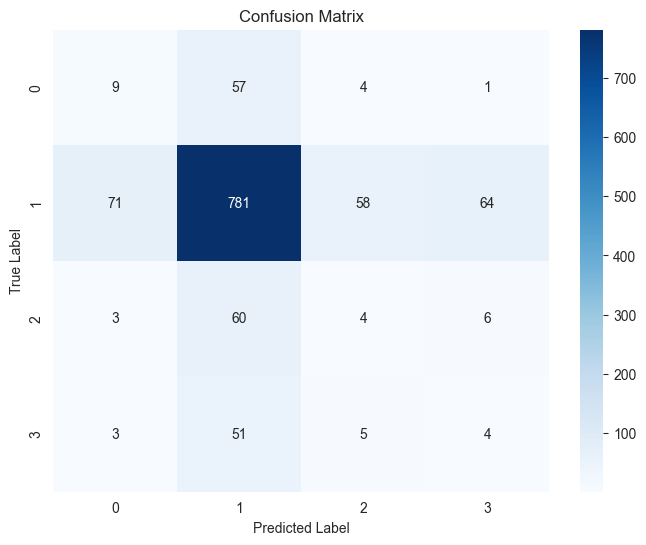

In [175]:
cm = confusion_matrix(y_test, predicted_labels)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


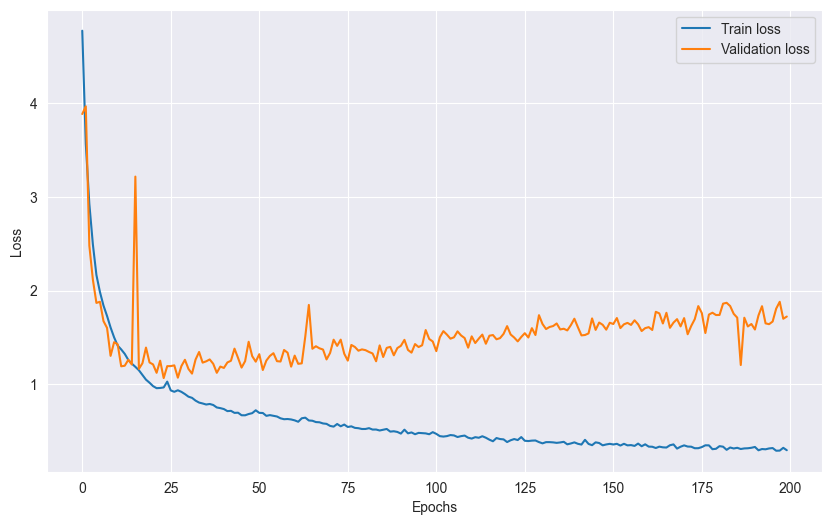

In [176]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss values
plt.figure(figsize=(10, 6))
plt.plot(train_loss, label='Train loss')
plt.plot(val_loss, label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [144]:

X_seq_train, X_seq_test, X_data_train, X_data_test, y_train, y_test = train_test_split(
    seq, data, y, test_size=0.15, random_state=42
)

# Split training data further into training and validation sets (80% for training, 20% for validation)
X_seq_train, X_seq_val, X_data_train, X_data_val, y_train, y_val = train_test_split(
    X_seq_train, X_data_train, y_train, test_size=0.15, random_state=42)

X_seq_train_flat = X_seq_train.reshape(X_seq_train.shape[0], -1)

# Concatenate the flattened time-series data (X_seq_train_flat) and static data (X_data_train)
X_combined_train = np.concatenate([X_seq_train_flat, X_data_train], axis=1)  # Shape will be (7000, 360 + num_static_features)

# Apply SMOTE to the combined data (time-series + static)
smote = SMOTE(random_state=42,sampling_strategy={0:800,1:5900,2:800,3:800})
X_combined_train_resampled, y_train_resampled = smote.fit_resample(X_combined_train, y_train)

# Split the resampled combined data back into time-series and static datasets
# Time-series data
X_seq_train_resampled_flat = X_combined_train_resampled[:, :X_seq_train_flat.shape[1]]  # Take the first 360 columns
X_seq_train_resampled = X_seq_train_resampled_flat.reshape(X_seq_train_resampled_flat.shape[0], 30, 12)  # Reshape back to (num_samples, 30, 12)

# Static data
X_data_train_resampled = X_combined_train_resampled[:, X_seq_train_flat.shape[1]:]  # Take the remaining columns for static data

# Convert to float32 for model compatibility
X_seq_train_resampled = np.array(X_seq_train_resampled, dtype=np.float32)
X_data_train_resampled = np.array(X_data_train_resampled, dtype=np.float32)
X_seq_val = np.array(X_seq_val, dtype=np.float32)
X_seq_test = np.array(X_seq_test, dtype=np.float32)
X_data_val = np.array(X_data_val, dtype=np.float32)


# Define the model
time_series_input = Input(shape=(30, 12))  # Input for time-series data
static_input = Input(shape=(X_data_train.shape[1],))  # Input for static features

# Masking and LSTM layers
masked_input = Masking(mask_value=-9999)(time_series_input)
lstm_out = LSTM(64, return_sequences=True, kernel_regularizer=regularizers.l2(0.01))(masked_input)
batch_norm_lstm1 = BatchNormalization()(lstm_out)
lstm_out2 = LSTM(64, return_sequences=False, kernel_regularizer=regularizers.l2(0.01))(batch_norm_lstm1)
batch_norm_lstm2 = BatchNormalization()(lstm_out2)

# Merge static features with LSTM output
merged = Concatenate()([batch_norm_lstm2, static_input])

# Fully connected layers
dense1 = Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.001))(merged)
batch_norm_dense1 = BatchNormalization()(dense1)
dense2 = Dense(16, activation='relu', kernel_regularizer=regularizers.l2(0.001))(batch_norm_dense1)
batch_norm_dense2 = BatchNormalization()(dense2)

# Output layer
output = Dense(4, activation='softmax')(batch_norm_dense2)  # Assuming 4 classes

# Create the model
model = Model(inputs=[time_series_input, static_input], outputs=output)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Define the learning rate reduction callback
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,  # Factor to reduce the learning rate by
    patience=10,  # Number of epochs with no improvement before reducing the learning rate
    min_lr=1e-6,  # Minimum learning rate
    verbose=1
)
history = model.fit([X_seq_train_resampled, X_data_train_resampled], y_train_resampled,
                    validation_data=([X_seq_val, X_data_val], y_val), epochs=30, batch_size=16,callbacks=[reduce_lr])

# Make predictions
predictions = model.predict([X_seq_test, X_data_test])
predicted_labels = predictions.argmax(axis=1)

# Print the classification report
print(classification_report(y_test, predicted_labels))


325/325 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6491 - loss: 0.8827
Epoch 18: val_accuracy did not improve from 0.80657
325/325 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.6491 - loss: 0.8827 - val_accuracy: 0.7872 - val_loss: 0.7546 - learning_rate: 1.0000e-04
Epoch 19/20
324/325 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6584 - loss: 0.8583
Epoch 19: val_accuracy did not improve from 0.80657
325/325 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.6584 - loss: 0.8584 - val_accuracy: 0.8058 - val_loss: 0.7407 - learning_rate: 1.0000e-04
Epoch 20/20
323/325 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6632 - loss: 0.8511
Epoch 20: val_accuracy did not improve from 0.80657
325/325 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.6632 - loss: 0.8512 - val_accuracy: 0.7939 - val_loss: 0.7531 - learning_rate: 1.0000e-04
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
              precision    recall  f1-score   support

           0       0.13      0.05      0.07        77
     